<a href="https://colab.research.google.com/github/tbeesofar/2021/blob/main/TimeDomainFeatureExtraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Feature Extration of sounds can be done in two levels 
1. Time Domain
2. Frequency Domain

In Time Domain, the sound is perceived in normal form where 
Y axis is amplitude and X is time

In Frequency Domain, the sound is perccieved in the form of its frequency components
with details like Magnitude.
Y axis contains the magnitude
X axis contains the frequecy values

Fourier transform is used to change sound representation from time domain to frequency domain


This is a python code to retrieve the audio features of time domain

Amplitude Envelope>>

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display
import IPython.display as ipd

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
cd /content/drive/MyDrive/DigitalAudioProcessing

/content/drive/MyDrive/DigitalAudioProcessing


In [4]:
ls

BBKingBlues.mp3        RabindraSangeet.mp3  TimeDomainFeatureExtraction.ipynb
PopMichealJackson.mp3  rabindrasangeet.wav


Load Audio Files using ipython display

In [5]:
blues_file = ipd.Audio('BBKingBlues.mp3')
rabindrasangeet_file = ipd.Audio('rabindrasangeet.wav')
pop_file = ipd.Audio('PopMichealJackson.mp3')


In [6]:
blues_file

In [7]:
#!apt install ffmpeg

In [8]:
#filename = librosa.util.example_audio_file()

In [9]:
rabindrasangeet, sr = librosa.load('RabindraSangeet.mp3')

/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


In [10]:
blues, _  = librosa.load('BBKingBlues.mp3')
pop, _ = librosa.load('PopMichealJackson.mp3')

/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Load files with librosa now

In [11]:
rabindrasangeet.shape


(6979072,)

In [12]:
# duration in seconds of 1 sample
sample_duration = 1 / sr
print(f"One sample lasts for {sample_duration:6f} seconds")

One sample lasts for 0.000045 seconds


In [13]:
# total number of samples in audio file
tot_samples = len(rabindrasangeet)
tot_samples

6979072

In [14]:

# duration of debussy audio in seconds
duration = 1 / sr * tot_samples
print(f"The audio lasts for {duration} seconds")

The audio lasts for 316.51120181405895 seconds


Visualize the audio

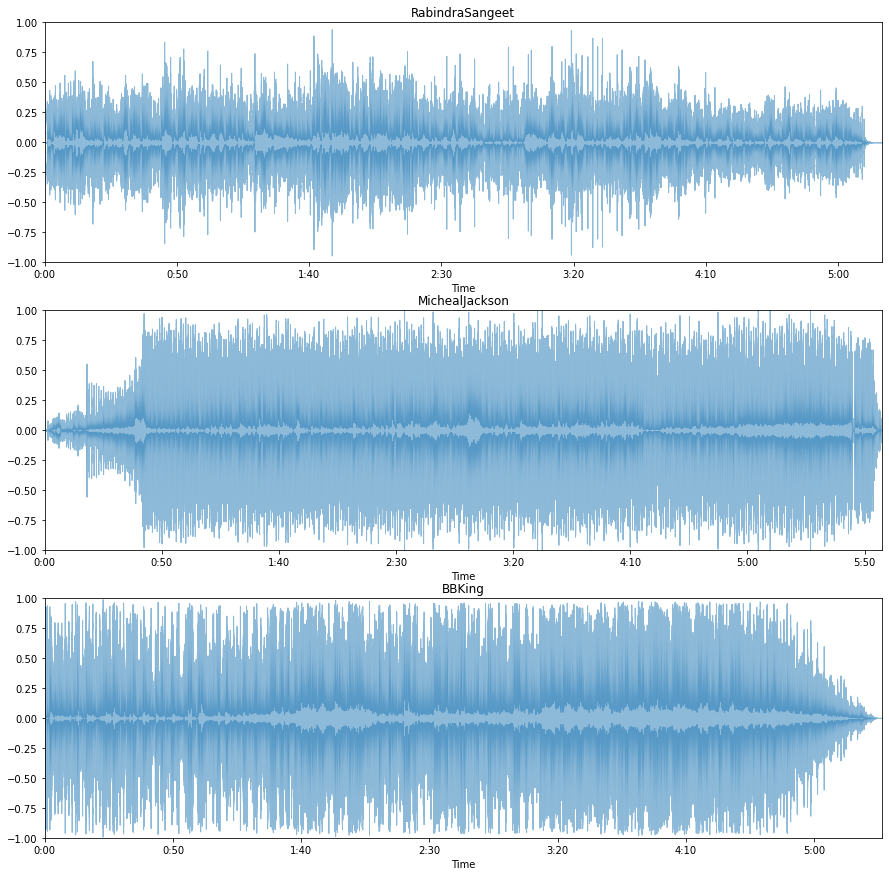

In [15]:

plt.figure(figsize=(15, 15)) #overall size of the figure

plt.subplot(3, 1, 1) #nrows, ncols, index
librosa.display.waveplot(rabindrasangeet, alpha=0.5)
plt.ylim((-1, 1))
plt.title("RabindraSangeet")

plt.subplot(3, 1, 2)
librosa.display.waveplot(pop, alpha=0.5)
plt.ylim((-1, 1))
plt.title("MichealJackson")

plt.subplot(3, 1, 3)
librosa.display.waveplot(blues, alpha=0.5)
plt.ylim((-1, 1))
plt.title("BBKing")

plt.show()

In [16]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

def amplitude_envelope(signal, frame_size, hop_length):
    """Calculate the amplitude envelope of a signal with a given frame size nad hop length."""
    amplitude_envelope = []
    
    # calculate amplitude envelope for each frame
    for i in range(0, len(signal), hop_length): 
        amplitude_envelope_current_frame = max(signal[i:i+frame_size]) 
        amplitude_envelope.append(amplitude_envelope_current_frame)
    
    return np.array(amplitude_envelope)

In [17]:
def fancy_amplitude_envelope(signal, frame_size, hop_length):
    """Fancier Python code to calculate the amplitude envelope of a signal with a given frame size."""
    return np.array([max(signal[i:i+frame_size]) for i in range(0, len(signal), hop_length)])

In [18]:

# number of frames in amplitude envelope
ae_rs = amplitude_envelope(rabindrasangeet, FRAME_SIZE, HOP_LENGTH)
len(ae_rs)

13631

In [19]:
# calculate amplitude envelope for blues and Pop
ae_pop = amplitude_envelope(pop, FRAME_SIZE, HOP_LENGTH)
ae_blues = amplitude_envelope(blues, FRAME_SIZE, HOP_LENGTH)

In [20]:
len(ae_pop)
len(ae_blues)

14057

Visualize AE

In [21]:
frames_rs = range(len(ae_rs))
t_rs = librosa.frames_to_time(frames_rs, hop_length=HOP_LENGTH)

frames_pop = range(len(ae_pop))
t_pop = librosa.frames_to_time(frames_pop, hop_length=HOP_LENGTH)

frames_blues = range(len(ae_blues))
t_blues = librosa.frames_to_time(frames_blues, hop_length=HOP_LENGTH)

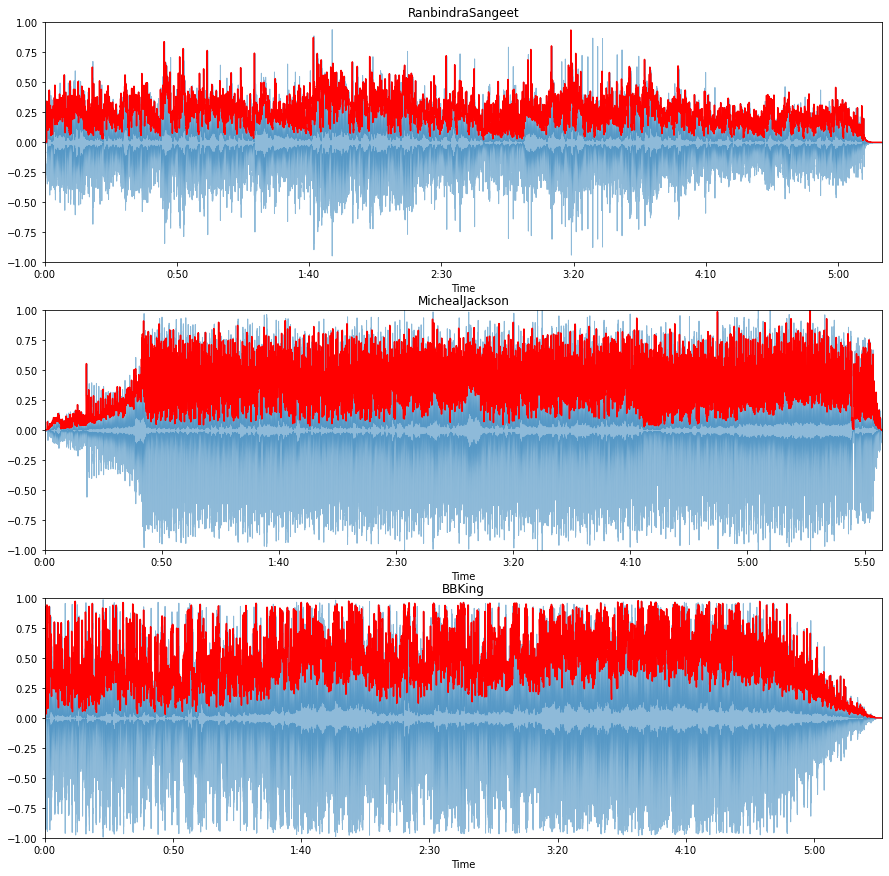

In [22]:

# amplitude envelope is graphed in red

plt.figure(figsize=(15, 15))

plt.subplot(3, 1, 1)
librosa.display.waveplot(rabindrasangeet, alpha=0.5)
plt.plot(t_rs, ae_rs, color="r")
plt.ylim((-1, 1))
plt.title("RanbindraSangeet")

plt.subplot(3, 1, 2)
librosa.display.waveplot(pop, alpha=0.5)
plt.plot(t_pop, ae_pop, color="r")
plt.ylim((-1, 1))
plt.title("MichealJackson")

plt.subplot(3, 1, 3)
librosa.display.waveplot(blues, alpha=0.5)
plt.plot(t_blues, ae_blues, color="r")
plt.ylim((-1, 1))
plt.title("BBKing")

plt.show()

RSM

In [23]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

In [26]:

rms_rabindra = librosa.feature.rms(rabindrasangeet, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_jackson = librosa.feature.rms(pop, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_king = librosa.feature.rms(blues, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [27]:
rms_rabindra

array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)

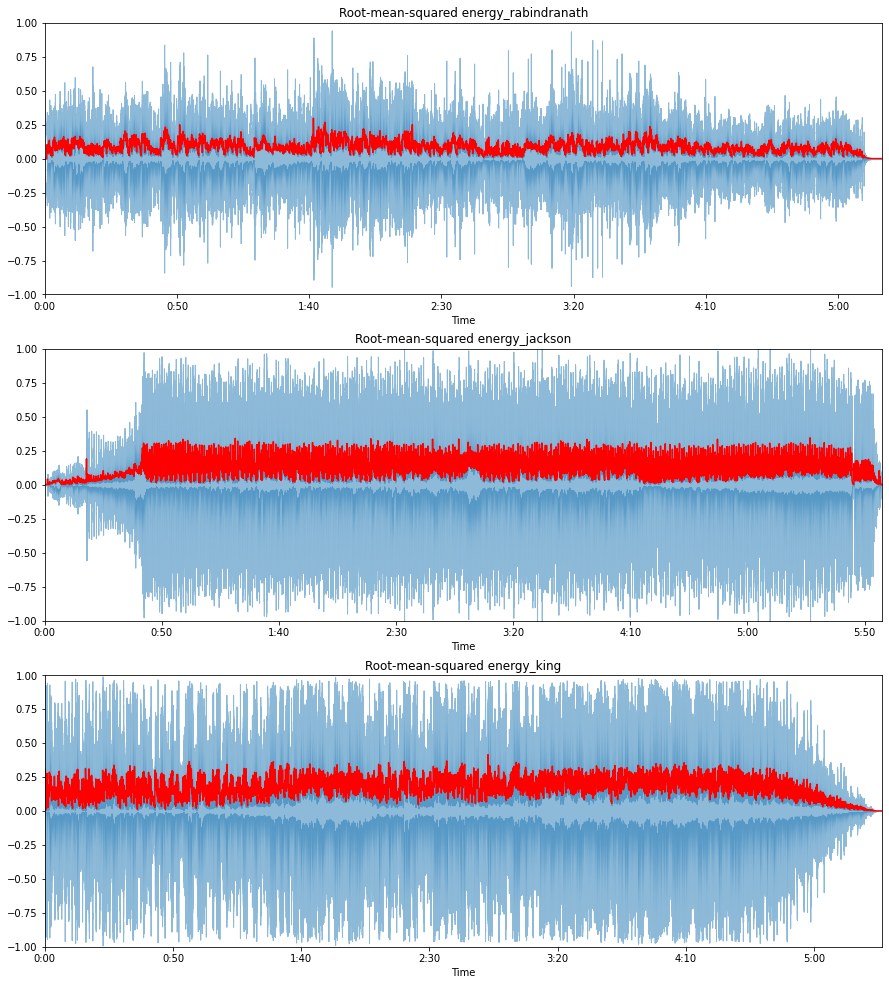

In [32]:
frames_rabindra = range(len(rms_rabindra))
frames_jackson = range(len(rms_jackson))
frames_king = range(len(rms_king))

t_rabindra_rms = librosa.frames_to_time(frames_rabindra, hop_length=HOP_LENGTH)
t_jackson_rms = librosa.frames_to_time(frames_jackson, hop_length=HOP_LENGTH)
t_king_rms = librosa.frames_to_time(frames_king, hop_length=HOP_LENGTH)

#frames_rs = range(len(ae_rs))
#t_rs = librosa.frames_to_time(frames_rs, hop_length=HOP_LENGTH)

plt.figure(figsize=(15, 17))

ax = plt.subplot(3, 1, 1)
librosa.display.waveplot(rabindrasangeet, alpha=0.5)
plt.plot(t_rabindra_rms, rms_rabindra, color="r")
plt.ylim((-1, 1))
plt.title("Root-mean-squared energy_rabindranath")

plt.subplot(3, 1, 2)
librosa.display.waveplot(pop, alpha=0.5)
plt.plot(t_jackson_rms, rms_jackson, color="r")
plt.ylim((-1, 1))
plt.title("Root-mean-squared energy_jackson")

plt.subplot(3, 1, 3)
librosa.display.waveplot(blues, alpha=0.5)
plt.plot(t_king_rms, rms_king, color="r")
plt.ylim((-1, 1))
plt.title("Root-mean-squared energy_king")

plt.show()

In [ ]:
"""def rmse(signal, frame_size, hop_length):
    rmse = []
    
    # calculate rmse for each frame
    for i in range(0, len(signal), hop_length): 
        rmse_current_frame = np.sqrt(sum(signal[i:i+frame_size]**2) / frame_size)
        rmse.append(rmse_current_frame)
    return np.array(rmse)"""

Zero Crossing Rate

In [33]:
zrc_rabindra = librosa.feature.zero_crossing_rate(rabindrasangeet, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
zrc_jackson = librosa.feature.zero_crossing_rate(pop, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
zrc_king = librosa.feature.zero_crossing_rate(blues, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [35]:
zrc_rabindra.size
zrc_jackson.size
zrc_king.size

14057

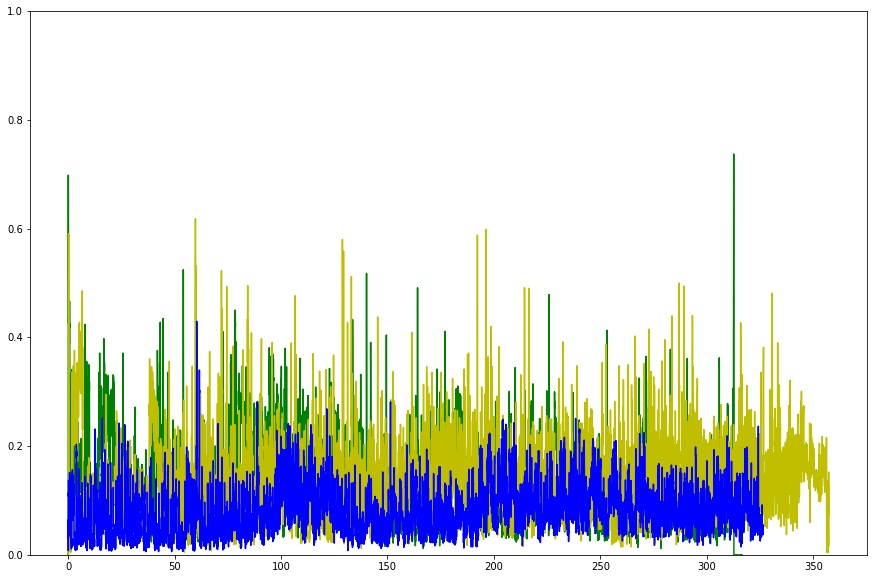

In [39]:
plt.figure(figsize=(15, 10))

plt.plot(t_rabindra_rms, zrc_rabindra, color="g")
plt.plot(t_jackson_rms, zrc_jackson, color="y")
plt.plot(t_king_rms, zrc_king, color="b")
plt.ylim(0, 1)
plt.show()